    Passenger locations:
    - 0: R(ed)
    - 1: G(reen)
    - 2: Y(ellow)
    - 3: B(lue)
    - 4: in taxi
    
    Destinations:
    - 0: R(ed)
    - 1: G(reen)
    - 2: Y(ellow)
    - 3: B(lue)
        
    Actions:
    There are 6 discrete deterministic actions:
    - 0: move south
    - 1: move north
    - 2: move east 
    - 3: move west 
    - 4: pickup passenger
    - 5: dropoff passenger
    
    Rewards: 
    There is a reward of -1 for each action and an additional reward of +20 for delivering the passenger.
    There is a reward of -10 for executing actions "pickup" and "dropoff" illegally.

In [9]:

from collections import defaultdict
import numpy as np
import gym
from collections import deque
import matplotlib.pyplot as plt
from matplotlib import style
from matplotlib.animation import FuncAnimation
%matplotlib inline

In [10]:

def plot(y):
    '''
    This function takes a list of scores as input and plots it.
    TODO: use animation
    '''
    plt.cla()

    plt.plot(y)
    plt.pause(0.5)
    plt.show()
    


In [11]:

environment = gym.make('Taxi-v3') #creating the environment
Q = np.zeros((500,6))             #creating the Q with 500 of array of length 6 to store
                                  #the Q value of each state action pair (Qsa)

In [25]:
done = False
state = environment.reset()
while not done:
    environment.render()
    action = int(input("select action"))
    next_state, reward, done, info = environment.step(action)
    print("Reward: {} | Done: {}".format(reward, done))
environment.close()

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+

select action3
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (West)
select action1
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)
select action1
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)
select action1
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)
select action3
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (West)
select action4
Reward: -1 | Done: False
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Pickup)
select action0
Reward: -1 | Done: False
+---------+
|R: | : :G|
|_: | : : |
| : : : : |
| | : | : |
|Y| : |B: |


In [12]:
def epsilon_greedy_policy(eps,state,action_size,Q):
    '''
    This function creates probabilities of taking each action based on the epsilon value
    
    param eps (f): The epsilon value, the closer the value to 1 the more random the selection
    param state (int): the current state that the agent is at
    param action_size (int): the range of possible actions
    param Q (np.arr): The Q table that contains all the state action pairs values
    
    output: probability of sellecting each action to be used with np.random.choice
    '''
    probability = np.array(np.ones(action_size)) * eps/action_size
    probability[np.argmax(Q[state])] += 1 - eps
    return probability


    

In [13]:
class Memory():
    def __init__(self, length=1000):
        self.memory = deque(maxlen=length)
        
    def add(self, experience):
        self.memory.append(experience)
        
    def sample(self, sample_size = 32):
        indexes = np.random.choice(np.arange(len(self.memory)),sample_size,replace=False)
        return [self.memory[index] for index in indexes]
    
    def kickstart(self,env, action_size, batch_size):
        state = env.reset()
        for _ in range(batch_size):
            action = np.random.choice(np.arange(6))
            new_state, reward, done, info = env.step(action)
            #print('new state: {} | reward: {}| done: {}|'.format(new_state,reward,done))
            self.add((state, action, reward, new_state, done))
            state = new_state if not done else env.reset()
            
        

In [21]:
epsilon = 1.0
decay_factor = 0.991
train_episodes = 200_000
#replay_size = 128
learning_rate = 0.7
discount_factor = 0.618
#moves_limit = 900
#memory = Memory(20000)
#memory.kickstart(environment,6,500)
Q = np.zeros((500,6))  


In [22]:
scores = []



for ep in range(train_episodes):
    #Q_ = Q.copy()
    score = 0
    done = False
    state = environment.reset()
    while not done:
        #environment.render()
        if np.random.uniform(0, 1) < epsilon:
            
            #probability = epsilon_greedy_policy(epsilon,state, 6, Q)
            #action = np.random.choice(np.arange(6),p=probability)
            
            action = environment.action_space.sample()
        else:
            action = np.argmax(Q_[state])
        new_state, reward, done, info = environment.step(action)
        if not done:
            Q[state,action] = Q[state,action]  + learning_rate * (reward + discount_factor * np.amax(Q[new_state])- Q[state,action])
        else:
            Q[state,action] = reward

        score += reward
        state = new_state
        
    if  ep%1000 == 0 and epsilon > 0.30:
        epsilon *= decay_factor
    if ep % 100 == 0:
        #plot(scores)
        print('Episode: {}\tScore: {}\tEpsilon: {}'.format(ep,score,epsilon))
        
    #scores.append(score)

    
    
    




Episode: 0	Score: -740	Epsilon: 0.991
Episode: 100	Score: -731	Epsilon: 0.991
Episode: 200	Score: -785	Epsilon: 0.991
Episode: 300	Score: -749	Epsilon: 0.991
Episode: 400	Score: -740	Epsilon: 0.991
Episode: 500	Score: -140	Epsilon: 0.991
Episode: 600	Score: -659	Epsilon: 0.991
Episode: 700	Score: -293	Epsilon: 0.991
Episode: 800	Score: -713	Epsilon: 0.991
Episode: 900	Score: -749	Epsilon: 0.991
Episode: 1000	Score: -839	Epsilon: 0.982081
Episode: 1100	Score: -821	Epsilon: 0.982081
Episode: 1200	Score: -587	Epsilon: 0.982081
Episode: 1300	Score: -812	Epsilon: 0.982081
Episode: 1400	Score: -803	Epsilon: 0.982081
Episode: 1500	Score: -839	Epsilon: 0.982081
Episode: 1600	Score: -830	Epsilon: 0.982081
Episode: 1700	Score: -677	Epsilon: 0.982081
Episode: 1800	Score: -704	Epsilon: 0.982081
Episode: 1900	Score: -803	Epsilon: 0.982081
Episode: 2000	Score: -758	Epsilon: 0.9732422709999999
Episode: 2100	Score: -731	Epsilon: 0.9732422709999999
Episode: 2200	Score: -541	Epsilon: 0.9732422709999999


Episode: 15600	Score: -459	Epsilon: 0.8653234472955799
Episode: 15700	Score: -508	Epsilon: 0.8653234472955799
Episode: 15800	Score: -322	Epsilon: 0.8653234472955799
Episode: 15900	Score: -165	Epsilon: 0.8653234472955799
Episode: 16000	Score: -538	Epsilon: 0.8575355362699196
Episode: 16100	Score: -436	Epsilon: 0.8575355362699196
Episode: 16200	Score: -38	Epsilon: 0.8575355362699196
Episode: 16300	Score: -193	Epsilon: 0.8575355362699196
Episode: 16400	Score: -556	Epsilon: 0.8575355362699196
Episode: 16500	Score: -125	Epsilon: 0.8575355362699196
Episode: 16600	Score: -258	Epsilon: 0.8575355362699196
Episode: 16700	Score: -216	Epsilon: 0.8575355362699196
Episode: 16800	Score: -98	Epsilon: 0.8575355362699196
Episode: 16900	Score: -271	Epsilon: 0.8575355362699196
Episode: 17000	Score: -668	Epsilon: 0.8498177164434904
Episode: 17100	Score: -50	Epsilon: 0.8498177164434904
Episode: 17200	Score: -239	Epsilon: 0.8498177164434904
Episode: 17300	Score: -321	Epsilon: 0.8498177164434904
Episode: 1740

Episode: 30600	Score: -228	Epsilon: 0.7555849328350213
Episode: 30700	Score: -356	Epsilon: 0.7555849328350213
Episode: 30800	Score: -226	Epsilon: 0.7555849328350213
Episode: 30900	Score: -165	Epsilon: 0.7555849328350213
Episode: 31000	Score: -320	Epsilon: 0.7487846684395061
Episode: 31100	Score: -168	Epsilon: 0.7487846684395061
Episode: 31200	Score: -100	Epsilon: 0.7487846684395061
Episode: 31300	Score: -48	Epsilon: 0.7487846684395061
Episode: 31400	Score: -264	Epsilon: 0.7487846684395061
Episode: 31500	Score: -291	Epsilon: 0.7487846684395061
Episode: 31600	Score: -247	Epsilon: 0.7487846684395061
Episode: 31700	Score: -462	Epsilon: 0.7487846684395061
Episode: 31800	Score: -171	Epsilon: 0.7487846684395061
Episode: 31900	Score: -383	Epsilon: 0.7487846684395061
Episode: 32000	Score: -178	Epsilon: 0.7420456064235506
Episode: 32100	Score: -19	Epsilon: 0.7420456064235506
Episode: 32200	Score: -198	Epsilon: 0.7420456064235506
Episode: 32300	Score: -147	Epsilon: 0.7420456064235506
Episode: 324

Episode: 45800	Score: -141	Epsilon: 0.6597632278561046
Episode: 45900	Score: -63	Epsilon: 0.6597632278561046
Episode: 46000	Score: -241	Epsilon: 0.6538253588053997
Episode: 46100	Score: -218	Epsilon: 0.6538253588053997
Episode: 46200	Score: -129	Epsilon: 0.6538253588053997
Episode: 46300	Score: -124	Epsilon: 0.6538253588053997
Episode: 46400	Score: -8	Epsilon: 0.6538253588053997
Episode: 46500	Score: -101	Epsilon: 0.6538253588053997
Episode: 46600	Score: -181	Epsilon: 0.6538253588053997
Episode: 46700	Score: -34	Epsilon: 0.6538253588053997
Episode: 46800	Score: -76	Epsilon: 0.6538253588053997
Episode: 46900	Score: -134	Epsilon: 0.6538253588053997
Episode: 47000	Score: -24	Epsilon: 0.6479409305761511
Episode: 47100	Score: -33	Epsilon: 0.6479409305761511
Episode: 47200	Score: -79	Epsilon: 0.6479409305761511
Episode: 47300	Score: -30	Epsilon: 0.6479409305761511
Episode: 47400	Score: -53	Epsilon: 0.6479409305761511
Episode: 47500	Score: -274	Epsilon: 0.6479409305761511
Episode: 47600	Score

Episode: 61200	Score: -42	Epsilon: 0.5709085907273037
Episode: 61300	Score: -31	Epsilon: 0.5709085907273037
Episode: 61400	Score: -25	Epsilon: 0.5709085907273037
Episode: 61500	Score: -27	Epsilon: 0.5709085907273037
Episode: 61600	Score: -119	Epsilon: 0.5709085907273037
Episode: 61700	Score: -74	Epsilon: 0.5709085907273037
Episode: 61800	Score: -33	Epsilon: 0.5709085907273037
Episode: 61900	Score: -20	Epsilon: 0.5709085907273037
Episode: 62000	Score: -30	Epsilon: 0.565770413410758
Episode: 62100	Score: -19	Epsilon: 0.565770413410758
Episode: 62200	Score: -50	Epsilon: 0.565770413410758
Episode: 62300	Score: -12	Epsilon: 0.565770413410758
Episode: 62400	Score: -56	Epsilon: 0.565770413410758
Episode: 62500	Score: -38	Epsilon: 0.565770413410758
Episode: 62600	Score: -23	Epsilon: 0.565770413410758
Episode: 62700	Score: -185	Epsilon: 0.565770413410758
Episode: 62800	Score: -45	Epsilon: 0.565770413410758
Episode: 62900	Score: -38	Epsilon: 0.565770413410758
Episode: 63000	Score: -78	Epsilon: 0

Episode: 76700	Score: -83	Epsilon: 0.49850715420667185
Episode: 76800	Score: -78	Epsilon: 0.49850715420667185
Episode: 76900	Score: -97	Epsilon: 0.49850715420667185
Episode: 77000	Score: -30	Epsilon: 0.4940205898188118
Episode: 77100	Score: -81	Epsilon: 0.4940205898188118
Episode: 77200	Score: -16	Epsilon: 0.4940205898188118
Episode: 77300	Score: -29	Epsilon: 0.4940205898188118
Episode: 77400	Score: -50	Epsilon: 0.4940205898188118
Episode: 77500	Score: -12	Epsilon: 0.4940205898188118
Episode: 77600	Score: -118	Epsilon: 0.4940205898188118
Episode: 77700	Score: -6	Epsilon: 0.4940205898188118
Episode: 77800	Score: -8	Epsilon: 0.4940205898188118
Episode: 77900	Score: -55	Epsilon: 0.4940205898188118
Episode: 78000	Score: -106	Epsilon: 0.4895744045104425
Episode: 78100	Score: -32	Epsilon: 0.4895744045104425
Episode: 78200	Score: -121	Epsilon: 0.4895744045104425
Episode: 78300	Score: -82	Epsilon: 0.4895744045104425
Episode: 78400	Score: -70	Epsilon: 0.4895744045104425
Episode: 78500	Score: -1

Episode: 92200	Score: 8	Epsilon: 0.4313699291796264
Episode: 92300	Score: -30	Epsilon: 0.4313699291796264
Episode: 92400	Score: -2	Epsilon: 0.4313699291796264
Episode: 92500	Score: -20	Epsilon: 0.4313699291796264
Episode: 92600	Score: -7	Epsilon: 0.4313699291796264
Episode: 92700	Score: -5	Epsilon: 0.4313699291796264
Episode: 92800	Score: -50	Epsilon: 0.4313699291796264
Episode: 92900	Score: -59	Epsilon: 0.4313699291796264
Episode: 93000	Score: -31	Epsilon: 0.4274875998170098
Episode: 93100	Score: -30	Epsilon: 0.4274875998170098
Episode: 93200	Score: -63	Epsilon: 0.4274875998170098
Episode: 93300	Score: -69	Epsilon: 0.4274875998170098
Episode: 93400	Score: -40	Epsilon: 0.4274875998170098
Episode: 93500	Score: -41	Epsilon: 0.4274875998170098
Episode: 93600	Score: -56	Epsilon: 0.4274875998170098
Episode: 93700	Score: -29	Epsilon: 0.4274875998170098
Episode: 93800	Score: -12	Epsilon: 0.4274875998170098
Episode: 93900	Score: -40	Epsilon: 0.4274875998170098
Episode: 94000	Score: -1	Epsilon:

Episode: 107400	Score: -34	Epsilon: 0.37666449462902574
Episode: 107500	Score: -21	Epsilon: 0.37666449462902574
Episode: 107600	Score: -6	Epsilon: 0.37666449462902574
Episode: 107700	Score: -52	Epsilon: 0.37666449462902574
Episode: 107800	Score: -42	Epsilon: 0.37666449462902574
Episode: 107900	Score: -15	Epsilon: 0.37666449462902574
Episode: 108000	Score: -6	Epsilon: 0.3732745141773645
Episode: 108100	Score: -2	Epsilon: 0.3732745141773645
Episode: 108200	Score: -43	Epsilon: 0.3732745141773645
Episode: 108300	Score: -59	Epsilon: 0.3732745141773645
Episode: 108400	Score: -29	Epsilon: 0.3732745141773645
Episode: 108500	Score: -42	Epsilon: 0.3732745141773645
Episode: 108600	Score: -12	Epsilon: 0.3732745141773645
Episode: 108700	Score: -24	Epsilon: 0.3732745141773645
Episode: 108800	Score: -14	Epsilon: 0.3732745141773645
Episode: 108900	Score: -14	Epsilon: 0.3732745141773645
Episode: 109000	Score: -17	Epsilon: 0.36991504354976823
Episode: 109100	Score: -4	Epsilon: 0.36991504354976823
Episod

Episode: 122700	Score: 9	Epsilon: 0.3288966891687548
Episode: 122800	Score: -46	Epsilon: 0.3288966891687548
Episode: 122900	Score: -26	Epsilon: 0.3288966891687548
Episode: 123000	Score: -6	Epsilon: 0.325936618966236
Episode: 123100	Score: 11	Epsilon: 0.325936618966236
Episode: 123200	Score: 9	Epsilon: 0.325936618966236
Episode: 123300	Score: -8	Epsilon: 0.325936618966236
Episode: 123400	Score: -3	Epsilon: 0.325936618966236
Episode: 123500	Score: 11	Epsilon: 0.325936618966236
Episode: 123600	Score: -42	Epsilon: 0.325936618966236
Episode: 123700	Score: -12	Epsilon: 0.325936618966236
Episode: 123800	Score: -10	Epsilon: 0.325936618966236
Episode: 123900	Score: -7	Epsilon: 0.325936618966236
Episode: 124000	Score: -1	Epsilon: 0.32300318939553985
Episode: 124100	Score: -55	Epsilon: 0.32300318939553985
Episode: 124200	Score: 8	Epsilon: 0.32300318939553985
Episode: 124300	Score: -13	Epsilon: 0.32300318939553985
Episode: 124400	Score: -39	Epsilon: 0.32300318939553985
Episode: 124500	Score: -39	E

Episode: 138100	Score: -25	Epsilon: 0.29776229356485107
Episode: 138200	Score: -5	Epsilon: 0.29776229356485107
Episode: 138300	Score: -21	Epsilon: 0.29776229356485107
Episode: 138400	Score: -8	Epsilon: 0.29776229356485107
Episode: 138500	Score: -7	Epsilon: 0.29776229356485107
Episode: 138600	Score: -18	Epsilon: 0.29776229356485107
Episode: 138700	Score: -30	Epsilon: 0.29776229356485107
Episode: 138800	Score: 7	Epsilon: 0.29776229356485107
Episode: 138900	Score: -6	Epsilon: 0.29776229356485107
Episode: 139000	Score: 7	Epsilon: 0.29776229356485107
Episode: 139100	Score: -3	Epsilon: 0.29776229356485107
Episode: 139200	Score: -6	Epsilon: 0.29776229356485107
Episode: 139300	Score: -5	Epsilon: 0.29776229356485107
Episode: 139400	Score: 9	Epsilon: 0.29776229356485107
Episode: 139500	Score: -7	Epsilon: 0.29776229356485107
Episode: 139600	Score: -11	Epsilon: 0.29776229356485107
Episode: 139700	Score: -30	Epsilon: 0.29776229356485107
Episode: 139800	Score: -37	Epsilon: 0.29776229356485107
Episod

Episode: 153000	Score: -20	Epsilon: 0.29776229356485107
Episode: 153100	Score: -8	Epsilon: 0.29776229356485107
Episode: 153200	Score: -9	Epsilon: 0.29776229356485107
Episode: 153300	Score: -14	Epsilon: 0.29776229356485107
Episode: 153400	Score: -10	Epsilon: 0.29776229356485107
Episode: 153500	Score: 0	Epsilon: 0.29776229356485107
Episode: 153600	Score: -19	Epsilon: 0.29776229356485107
Episode: 153700	Score: -31	Epsilon: 0.29776229356485107
Episode: 153800	Score: -4	Epsilon: 0.29776229356485107
Episode: 153900	Score: -10	Epsilon: 0.29776229356485107
Episode: 154000	Score: -32	Epsilon: 0.29776229356485107
Episode: 154100	Score: -8	Epsilon: 0.29776229356485107
Episode: 154200	Score: -31	Epsilon: 0.29776229356485107
Episode: 154300	Score: 8	Epsilon: 0.29776229356485107
Episode: 154400	Score: -7	Epsilon: 0.29776229356485107
Episode: 154500	Score: -6	Epsilon: 0.29776229356485107
Episode: 154600	Score: -69	Epsilon: 0.29776229356485107
Episode: 154700	Score: -17	Epsilon: 0.29776229356485107
Ep

Episode: 168300	Score: -32	Epsilon: 0.29776229356485107
Episode: 168400	Score: -9	Epsilon: 0.29776229356485107
Episode: 168500	Score: -32	Epsilon: 0.29776229356485107
Episode: 168600	Score: -4	Epsilon: 0.29776229356485107
Episode: 168700	Score: -7	Epsilon: 0.29776229356485107
Episode: 168800	Score: -39	Epsilon: 0.29776229356485107
Episode: 168900	Score: -22	Epsilon: 0.29776229356485107
Episode: 169000	Score: -9	Epsilon: 0.29776229356485107
Episode: 169100	Score: -7	Epsilon: 0.29776229356485107
Episode: 169200	Score: -38	Epsilon: 0.29776229356485107
Episode: 169300	Score: -33	Epsilon: 0.29776229356485107
Episode: 169400	Score: 6	Epsilon: 0.29776229356485107
Episode: 169500	Score: -38	Epsilon: 0.29776229356485107
Episode: 169600	Score: -20	Epsilon: 0.29776229356485107
Episode: 169700	Score: -14	Epsilon: 0.29776229356485107
Episode: 169800	Score: -26	Epsilon: 0.29776229356485107
Episode: 169900	Score: 3	Epsilon: 0.29776229356485107
Episode: 170000	Score: -14	Epsilon: 0.29776229356485107
E

Episode: 183200	Score: 9	Epsilon: 0.29776229356485107
Episode: 183300	Score: -16	Epsilon: 0.29776229356485107
Episode: 183400	Score: -4	Epsilon: 0.29776229356485107
Episode: 183500	Score: -25	Epsilon: 0.29776229356485107
Episode: 183600	Score: -19	Epsilon: 0.29776229356485107
Episode: 183700	Score: 12	Epsilon: 0.29776229356485107
Episode: 183800	Score: 4	Epsilon: 0.29776229356485107
Episode: 183900	Score: -13	Epsilon: 0.29776229356485107
Episode: 184000	Score: 3	Epsilon: 0.29776229356485107
Episode: 184100	Score: -11	Epsilon: 0.29776229356485107
Episode: 184200	Score: -22	Epsilon: 0.29776229356485107
Episode: 184300	Score: 3	Epsilon: 0.29776229356485107
Episode: 184400	Score: 8	Epsilon: 0.29776229356485107
Episode: 184500	Score: -32	Epsilon: 0.29776229356485107
Episode: 184600	Score: -10	Epsilon: 0.29776229356485107
Episode: 184700	Score: -12	Epsilon: 0.29776229356485107
Episode: 184800	Score: -17	Epsilon: 0.29776229356485107
Episode: 184900	Score: 6	Epsilon: 0.29776229356485107
Episod

Episode: 198100	Score: -34	Epsilon: 0.29776229356485107
Episode: 198200	Score: -2	Epsilon: 0.29776229356485107
Episode: 198300	Score: -22	Epsilon: 0.29776229356485107
Episode: 198400	Score: -13	Epsilon: 0.29776229356485107
Episode: 198500	Score: -8	Epsilon: 0.29776229356485107
Episode: 198600	Score: 8	Epsilon: 0.29776229356485107
Episode: 198700	Score: -8	Epsilon: 0.29776229356485107
Episode: 198800	Score: -2	Epsilon: 0.29776229356485107
Episode: 198900	Score: -14	Epsilon: 0.29776229356485107
Episode: 199000	Score: 0	Epsilon: 0.29776229356485107
Episode: 199100	Score: -23	Epsilon: 0.29776229356485107
Episode: 199200	Score: 7	Epsilon: 0.29776229356485107
Episode: 199300	Score: -8	Epsilon: 0.29776229356485107
Episode: 199400	Score: -15	Epsilon: 0.29776229356485107
Episode: 199500	Score: -17	Epsilon: 0.29776229356485107
Episode: 199600	Score: -21	Epsilon: 0.29776229356485107
Episode: 199700	Score: -51	Epsilon: 0.29776229356485107
Episode: 199800	Score: -17	Epsilon: 0.29776229356485107
Epi

"   \n    replay = memory.sample(replay_size)\n    for experience in replay:\n        state, action, reward, new_state, done = experience\n        if not done:\n            Q[state][action] =  (1-learning_rate)*Q[state][action]  + learning_rate * (reward + (discount_factor * np.amax(Q[new_state])))\n        else:\n            Q[state][action] = -10\n\n    if  epsilon > 0.30:\n        epsilon *= decay_factor\n    if ep % 100 == 0:\n        #plot(scores)\n        print('Episode: {}\tScore: {}\tEpsilon: {}'.format(ep,score,epsilon))\n"

In [58]:
'''
Double Q learning implementation
'''
Q = np.zeros((500,6))  

scores = []

state = environment.reset()

for ep in range(train_episodes):
    Q_past = Q.copy() 
    score = 0
    done = False
    state = environment.reset()
    while not done:
        #environment.render()
        if np.random.uniform(0, 1) < epsilon:
            
            #probability = epsilon_greedy_policy(epsilon,state, 6, Q)
            #action = np.random.choice(np.arange(6),p=probability)
            
            action = environment.action_space.sample()
        else:
            action = np.argmax(Q_past[state])
        new_state, reward, done, info = environment.step(action)
        memory.add((state, action, reward, new_state, done))
        score += reward
        state = new_state
        
        scores.append(score)
        
    replay = memory.sample(replay_size)
    for experience in replay:
        state, action, reward, new_state, done = experience
        Q[state][action] =  Q_past[state][action]  + learning_rate * (reward + discount_factor * np.amax(Q_past[new_state] -Q_past[state][action]))
        
    if ep%100 == 0 and epsilon > 0.30:
        epsilon *= decay_factor
    if ep % 100 == 0:
        #plot(scores)
        print('Episode: {}\tScore: {}\tEpsilon: {}'.format(ep,score,epsilon))

Episode: 0	Score: -353	Epsilon: 0.29991959280549474
Episode: 100	Score: -848	Epsilon: 0.29991959280549474
Episode: 200	Score: -488	Epsilon: 0.29991959280549474
Episode: 300	Score: -362	Epsilon: 0.29991959280549474
Episode: 400	Score: -326	Epsilon: 0.29991959280549474
Episode: 500	Score: -389	Epsilon: 0.29991959280549474
Episode: 600	Score: -416	Epsilon: 0.29991959280549474
Episode: 700	Score: -362	Epsilon: 0.29991959280549474
Episode: 800	Score: -488	Epsilon: 0.29991959280549474
Episode: 900	Score: 12	Epsilon: 0.29991959280549474
Episode: 1000	Score: -43	Epsilon: 0.29991959280549474
Episode: 1100	Score: -371	Epsilon: 0.29991959280549474
Episode: 1200	Score: -362	Epsilon: 0.29991959280549474
Episode: 1300	Score: -344	Epsilon: 0.29991959280549474
Episode: 1400	Score: -36	Epsilon: 0.29991959280549474
Episode: 1500	Score: -71	Epsilon: 0.29991959280549474
Episode: 1600	Score: -9	Epsilon: 0.29991959280549474
Episode: 1700	Score: -237	Epsilon: 0.29991959280549474
Episode: 1800	Score: -5	Epsil

Episode: 15300	Score: -18	Epsilon: 0.29991959280549474
Episode: 15400	Score: 10	Epsilon: 0.29991959280549474
Episode: 15500	Score: 6	Epsilon: 0.29991959280549474
Episode: 15600	Score: -11	Epsilon: 0.29991959280549474
Episode: 15700	Score: -17	Epsilon: 0.29991959280549474
Episode: 15800	Score: -5	Epsilon: 0.29991959280549474
Episode: 15900	Score: -8	Epsilon: 0.29991959280549474
Episode: 16000	Score: 7	Epsilon: 0.29991959280549474
Episode: 16100	Score: -51	Epsilon: 0.29991959280549474
Episode: 16200	Score: -31	Epsilon: 0.29991959280549474
Episode: 16300	Score: -23	Epsilon: 0.29991959280549474
Episode: 16400	Score: -4	Epsilon: 0.29991959280549474
Episode: 16500	Score: -1	Epsilon: 0.29991959280549474
Episode: 16600	Score: 2	Epsilon: 0.29991959280549474
Episode: 16700	Score: -6	Epsilon: 0.29991959280549474
Episode: 16800	Score: -7	Epsilon: 0.29991959280549474
Episode: 16900	Score: -21	Epsilon: 0.29991959280549474
Episode: 17000	Score: -28	Epsilon: 0.29991959280549474
Episode: 17100	Score: -

Episode: 30400	Score: 10	Epsilon: 0.29991959280549474
Episode: 30500	Score: 11	Epsilon: 0.29991959280549474
Episode: 30600	Score: -53	Epsilon: 0.29991959280549474
Episode: 30700	Score: 1	Epsilon: 0.29991959280549474
Episode: 30800	Score: -16	Epsilon: 0.29991959280549474
Episode: 30900	Score: 5	Epsilon: 0.29991959280549474
Episode: 31000	Score: -3	Epsilon: 0.29991959280549474
Episode: 31100	Score: -20	Epsilon: 0.29991959280549474
Episode: 31200	Score: -36	Epsilon: 0.29991959280549474
Episode: 31300	Score: -20	Epsilon: 0.29991959280549474
Episode: 31400	Score: -33	Epsilon: 0.29991959280549474
Episode: 31500	Score: -9	Epsilon: 0.29991959280549474
Episode: 31600	Score: -13	Epsilon: 0.29991959280549474
Episode: 31700	Score: -7	Epsilon: 0.29991959280549474
Episode: 31800	Score: -3	Epsilon: 0.29991959280549474
Episode: 31900	Score: -35	Epsilon: 0.29991959280549474
Episode: 32000	Score: -1	Epsilon: 0.29991959280549474
Episode: 32100	Score: -4	Epsilon: 0.29991959280549474
Episode: 32200	Score: 

Episode: 45500	Score: -31	Epsilon: 0.29991959280549474
Episode: 45600	Score: -6	Epsilon: 0.29991959280549474
Episode: 45700	Score: -12	Epsilon: 0.29991959280549474
Episode: 45800	Score: 1	Epsilon: 0.29991959280549474
Episode: 45900	Score: -27	Epsilon: 0.29991959280549474
Episode: 46000	Score: -27	Epsilon: 0.29991959280549474
Episode: 46100	Score: -53	Epsilon: 0.29991959280549474
Episode: 46200	Score: -12	Epsilon: 0.29991959280549474
Episode: 46300	Score: -3	Epsilon: 0.29991959280549474
Episode: 46400	Score: -13	Epsilon: 0.29991959280549474
Episode: 46500	Score: -17	Epsilon: 0.29991959280549474
Episode: 46600	Score: 7	Epsilon: 0.29991959280549474
Episode: 46700	Score: -12	Epsilon: 0.29991959280549474
Episode: 46800	Score: -10	Epsilon: 0.29991959280549474
Episode: 46900	Score: 1	Epsilon: 0.29991959280549474
Episode: 47000	Score: -36	Epsilon: 0.29991959280549474
Episode: 47100	Score: -9	Epsilon: 0.29991959280549474
Episode: 47200	Score: 4	Epsilon: 0.29991959280549474
Episode: 47300	Score:

KeyboardInterrupt: 

In [16]:
print(learning_rate)

1.0000000000000002e-06


In [35]:
'''
A modified learning process to only quit the episode when the agent makes an
illegal drop. Apparently it does not work well compared to ending an episode
whenever the agent wins (legal drop) or makes an illegal drop.
'''
state = environment.reset()

for ep in range(train_episodes):
    score = 0
    game_over = False
    state = environment.reset()
    while not game_over:
        #environment.render()
        if np.random.uniform(0, 1) < epsilon:
            
            #probability = epsilon_greedy_policy(epsilon,state, 6, Q)
            #action = np.random.choice(np.arange(6),p=probability)
            
            action = environment.action_space.sample()
        else:
            action = np.argmax(Q[state])
        new_state, reward, done, info = environment.step(action)
        
        memory.add((state, action, reward, new_state, done))
        score += reward
        #print('Reward: {}'.format(reward))
        if reward == 20:
            #print('delivered a passenger')
            state = environment.reset()
        elif reward == -10:
            #print('episode ended')
            game_over = True
        else:
            state = new_state
        
        
        #scores.append(score)
        
    replay = memory.sample(replay_size)
    for experience in replay:
        state, action, reward, new_state, done = experience
        Q[state][action] =  Q[state][action]  + learning_rate * (reward + discount_factor * np.amax(Q[new_state] -Q[state][action]))
        
    if ep%50 == 0 and epsilon > 0.30:
        epsilon *= decay_factor
    if ep % 100 == 0:
        #plot(scores)
        print('Episode: {}\tScore: {}\tEpsilon: {}'.format(ep,score,epsilon))

Episode: 0	Score: -10	Epsilon: 0.9996
Episode: 100	Score: -10	Epsilon: 0.9988004799360002
Episode: 200	Score: -12	Epsilon: 0.9980015993601283
Episode: 300	Score: -13	Epsilon: 0.9972033577608963
Episode: 400	Score: -20	Epsilon: 0.9964057546272249
Episode: 500	Score: -10	Epsilon: 0.9956087894484439
Episode: 600	Score: -13	Epsilon: 0.9948124617142915
Episode: 700	Score: -11	Epsilon: 0.994016770914914
Episode: 800	Score: -10	Epsilon: 0.9932217165408654
Episode: 900	Score: -11	Epsilon: 0.9924272980831075
Episode: 1000	Score: -16	Epsilon: 0.9916335150330088
Episode: 1100	Score: -12	Epsilon: 0.9908403668823449
Episode: 1200	Score: -11	Epsilon: 0.9900478531232978
Episode: 1300	Score: -15	Epsilon: 0.9892559732484557
Episode: 1400	Score: -12	Epsilon: 0.9884647267508128
Episode: 1500	Score: -11	Epsilon: 0.9876741131237684
Episode: 1600	Score: -16	Epsilon: 0.9868841318611276
Episode: 1700	Score: -10	Epsilon: 0.9860947824570998
Episode: 1800	Score: -10	Epsilon: 0.9853060644062994
Episode: 1900	Scor

Episode: 15500	Score: -10	Epsilon: 0.8830045843196745
Episode: 15600	Score: -11	Epsilon: 0.8822983219329524
Episode: 15700	Score: -11	Epsilon: 0.8815926244431377
Episode: 15800	Score: -10	Epsilon: 0.8808874913984032
Episode: 15900	Score: -26	Epsilon: 0.8801829223472832
Episode: 16000	Score: -14	Epsilon: 0.879478916838673
Episode: 16100	Score: -10	Epsilon: 0.8787754744218288
Episode: 16200	Score: -12	Epsilon: 0.8780725946463673
Episode: 16300	Score: -10	Epsilon: 0.8773702770622654
Episode: 16400	Score: -12	Epsilon: 0.8766685212198599
Episode: 16500	Score: -10	Epsilon: 0.8759673266698476
Episode: 16600	Score: -10	Epsilon: 0.875266692963284
Episode: 16700	Score: -10	Epsilon: 0.8745666196515843
Episode: 16800	Score: -23	Epsilon: 0.8738671062865223
Episode: 16900	Score: -17	Epsilon: 0.8731681524202302
Episode: 17000	Score: -10	Epsilon: 0.8724697576051984
Episode: 17100	Score: -11	Epsilon: 0.8717719213942755
Episode: 17200	Score: -11	Epsilon: 0.8710746433406676
Episode: 17300	Score: -12	Epsi

Episode: 30800	Score: -11	Epsilon: 0.7812583631423701
Episode: 30900	Score: -15	Epsilon: 0.7806334814531943
Episode: 31000	Score: -12	Epsilon: 0.7800090995693889
Episode: 31100	Score: -10	Epsilon: 0.7793852170911894
Episode: 31200	Score: -10	Epsilon: 0.7787618336191512
Episode: 31300	Score: -12	Epsilon: 0.7781389487541492
Episode: 31400	Score: -13	Epsilon: 0.7775165620973777
Episode: 31500	Score: -11	Epsilon: 0.7768946732503498
Episode: 31600	Score: -13	Epsilon: 0.7762732818148973
Episode: 31700	Score: -10	Epsilon: 0.7756523873931706
Episode: 31800	Score: -12	Epsilon: 0.7750319895876381
Episode: 31900	Score: -10	Epsilon: 0.7744120880010864
Episode: 32000	Score: -11	Epsilon: 0.7737926822366197
Episode: 32100	Score: -14	Epsilon: 0.7731737718976596
Episode: 32200	Score: -12	Epsilon: 0.772555356587945
Episode: 32300	Score: -10	Epsilon: 0.7719374359115317
Episode: 32400	Score: -13	Epsilon: 0.7713200094727923
Episode: 32500	Score: -10	Epsilon: 0.7707030768764157
Episode: 32600	Score: -12	Eps

Episode: 46000	Score: -10	Epsilon: 0.6917894036596375
Episode: 46100	Score: -11	Epsilon: 0.6912360828230144
Episode: 46200	Score: -10	Epsilon: 0.6906832045545294
Episode: 46300	Score: -21	Epsilon: 0.6901307685001985
Episode: 46400	Score: -17	Epsilon: 0.6895787743063214
Episode: 46500	Score: -11	Epsilon: 0.6890272216194803
Episode: 46600	Score: -12	Epsilon: 0.6884761100865402
Episode: 46700	Score: -12	Epsilon: 0.6879254393546487
Episode: 46800	Score: -12	Epsilon: 0.6873752090712353
Episode: 46900	Score: -16	Epsilon: 0.6868254188840118
Episode: 47000	Score: -10	Epsilon: 0.6862760684409718
Episode: 47100	Score: -11	Epsilon: 0.68572715739039
Episode: 47200	Score: -10	Epsilon: 0.6851786853808229
Episode: 47300	Score: -12	Epsilon: 0.6846306520611081
Episode: 47400	Score: -17	Epsilon: 0.6840830570803635
Episode: 47500	Score: -10	Epsilon: 0.6835359000879885
Episode: 47600	Score: -11	Epsilon: 0.6829891807336622
Episode: 47700	Score: -12	Epsilon: 0.6824428986673442
Episode: 47800	Score: -12	Epsi

Episode: 61300	Score: -14	Epsilon: 0.6120763886619858
Episode: 61400	Score: -15	Epsilon: 0.6115868254832785
Episode: 61500	Score: -21	Epsilon: 0.6110976538767839
Episode: 61600	Score: -24	Epsilon: 0.6106088735293072
Episode: 61700	Score: -13	Epsilon: 0.6101204841279035
Episode: 61800	Score: -14	Epsilon: 0.6096324853598788
Episode: 61900	Score: -18	Epsilon: 0.6091448769127885
Episode: 62000	Score: -20	Epsilon: 0.6086576584744386
Episode: 62100	Score: -12	Epsilon: 0.6081708297328845
Episode: 62200	Score: -10	Epsilon: 0.607684390376431
Episode: 62300	Score: -14	Epsilon: 0.6071983400936324
Episode: 62400	Score: -32	Epsilon: 0.606712678573292
Episode: 62500	Score: -14	Epsilon: 0.606227405504462
Episode: 62600	Score: -12	Epsilon: 0.6057425205764434
Episode: 62700	Score: -12	Epsilon: 0.6052580234787857
Episode: 62800	Score: -10	Epsilon: 0.6047739139012864
Episode: 62900	Score: -11	Epsilon: 0.6042901915339917
Episode: 63000	Score: -11	Epsilon: 0.6038068560671951
Episode: 63100	Score: -10	Epsil

Episode: 76600	Score: -10	Epsilon: 0.541548487987279
Episode: 76700	Score: -22	Epsilon: 0.5411153358446472
Episode: 76800	Score: -16	Epsilon: 0.5406825301544254
Episode: 76900	Score: -14	Epsilon: 0.5402500706395067
Episode: 77000	Score: -11	Epsilon: 0.5398179570230064
Episode: 77100	Score: -13	Epsilon: 0.5393861890282612
Episode: 77200	Score: -10	Epsilon: 0.5389547663788289
Episode: 77300	Score: -31	Epsilon: 0.5385236887984886
Episode: 77400	Score: -11	Epsilon: 0.5380929560112401
Episode: 77500	Score: -17	Epsilon: 0.537662567741304
Episode: 77600	Score: -17	Epsilon: 0.5372325237131219
Episode: 77700	Score: -17	Epsilon: 0.5368028236513553
Episode: 77800	Score: -16	Epsilon: 0.5363734672808861
Episode: 77900	Score: -12	Epsilon: 0.5359444543268161
Episode: 78000	Score: -16	Epsilon: 0.5355157845144675
Episode: 78100	Score: -21	Epsilon: 0.5350874575693815
Episode: 78200	Score: -10	Epsilon: 0.5346594732173192
Episode: 78300	Score: -10	Epsilon: 0.5342318311842611
Episode: 78400	Score: -22	Epsi

Episode: 91800	Score: -16	Epsilon: 0.4795308738208375
Episode: 91900	Score: -10	Epsilon: 0.47914732584672065
Episode: 92000	Score: -17	Epsilon: 0.47876408464961545
Episode: 92100	Score: -32	Epsilon: 0.4783811499841493
Episode: 92200	Score: -16	Epsilon: 0.47799852160514605
Episode: 92300	Score: -18	Epsilon: 0.47761619926762544
Episode: 92400	Score: -13	Epsilon: 0.4772341827268033
Episode: 92500	Score: -12	Epsilon: 0.4768524717380911
Episode: 92600	Score: -19	Epsilon: 0.47647106605709616
Episode: 92700	Score: -15	Epsilon: 0.47608996543962107
Episode: 92800	Score: -18	Epsilon: 0.4757091696416639
Episode: 92900	Score: -11	Epsilon: 0.4753286784194177
Episode: 93000	Score: -13	Epsilon: 0.47494849152927077
Episode: 93100	Score: -11	Epsilon: 0.47456860872780604
Episode: 93200	Score: -15	Epsilon: 0.4741890297718012
Episode: 93300	Score: -10	Epsilon: 0.4738097544182286
Episode: 93400	Score: -1	Epsilon: 0.47343078242425474
Episode: 93500	Score: -18	Epsilon: 0.4730521135472406
Episode: 93600	Score

Episode: 106800	Score: -13	Epsilon: 0.42529552209075316
Episode: 106900	Score: -15	Epsilon: 0.42495535372036414
Episode: 107000	Score: -13	Epsilon: 0.4246154574302445
Episode: 107100	Score: -12	Epsilon: 0.42427583300277355
Episode: 107200	Score: -10	Epsilon: 0.4239364802205047
Episode: 107300	Score: -12	Epsilon: 0.42359739886616515
Episode: 107400	Score: -12	Epsilon: 0.42325858872265604
Episode: 107500	Score: -21	Epsilon: 0.4229200495730521
Episode: 107600	Score: -22	Epsilon: 0.4225817812006017
Episode: 107700	Score: -10	Epsilon: 0.42224378338872626
Episode: 107800	Score: -10	Epsilon: 0.42190605592102065
Episode: 107900	Score: -12	Epsilon: 0.4215685985812528
Episode: 108000	Score: -15	Epsilon: 0.4212314111533636
Episode: 108100	Score: -15	Epsilon: 0.42089449342146673
Episode: 108200	Score: -28	Epsilon: 0.42055784516984857
Episode: 108300	Score: -13	Epsilon: 0.42022146618296796
Episode: 108400	Score: -13	Epsilon: 0.4198853562454562
Episode: 108500	Score: -15	Epsilon: 0.41954951514211686

Episode: 121700	Score: -14	Epsilon: 0.37749617153933296
Episode: 121800	Score: -17	Epsilon: 0.37719423500148896
Episode: 121900	Score: -11	Epsilon: 0.3768925399645654
Episode: 122000	Score: 2	Epsilon: 0.37659108623540016
Episode: 122100	Score: -28	Epsilon: 0.37628987362098565
Episode: 122200	Score: -10	Epsilon: 0.3759889019284687
Episode: 122300	Score: -15	Epsilon: 0.3756881709651503
Episode: 122400	Score: -18	Epsilon: 0.37538768053848554
Episode: 122500	Score: -11	Epsilon: 0.37508743045608367
Episode: 122600	Score: -19	Epsilon: 0.37478742052570774
Episode: 122700	Score: -14	Epsilon: 0.3744876505552745
Episode: 122800	Score: -13	Epsilon: 0.37418812035285437
Episode: 122900	Score: -16	Epsilon: 0.37388882972667137
Episode: 123000	Score: -27	Epsilon: 0.37358977848510283
Episode: 123100	Score: -11	Epsilon: 0.3732909664366793
Episode: 123200	Score: -13	Epsilon: 0.3729923933900846
Episode: 123300	Score: -18	Epsilon: 0.37269405915415554
Episode: 123400	Score: -13	Epsilon: 0.37239596353788174


Episode: 136600	Score: -21	Epsilon: 0.3350690334718477
Episode: 136700	Score: -17	Epsilon: 0.3348010318561156
Episode: 136800	Score: -11	Epsilon: 0.33453324459879585
Episode: 136900	Score: -12	Epsilon: 0.33426567152843595
Episode: 137000	Score: -18	Epsilon: 0.3339983124737207
Episode: 137100	Score: -15	Epsilon: 0.33373116726347174
Episode: 137200	Score: -14	Epsilon: 0.33346423572664774
Episode: 137300	Score: -1	Epsilon: 0.3331975176923441
Episode: 137400	Score: -20	Epsilon: 0.3329310129897931
Episode: 137500	Score: -2	Epsilon: 0.3326647214483634
Episode: 137600	Score: -10	Epsilon: 0.3323986428975602
Episode: 137700	Score: -5	Epsilon: 0.33213277716702505
Episode: 137800	Score: -15	Epsilon: 0.3318671240865358
Episode: 137900	Score: -13	Epsilon: 0.33160168348600644
Episode: 138000	Score: -12	Epsilon: 0.331336455195487
Episode: 138100	Score: -21	Epsilon: 0.33107143904516345
Episode: 138200	Score: -24	Epsilon: 0.33080663486535755
Episode: 138300	Score: -20	Epsilon: 0.33054204248652685
Episo

Episode: 151500	Score: -19	Epsilon: 0.29991959280549474
Episode: 151600	Score: -12	Epsilon: 0.29991959280549474
Episode: 151700	Score: -19	Epsilon: 0.29991959280549474
Episode: 151800	Score: -18	Epsilon: 0.29991959280549474
Episode: 151900	Score: -15	Epsilon: 0.29991959280549474
Episode: 152000	Score: -19	Epsilon: 0.29991959280549474
Episode: 152100	Score: -2	Epsilon: 0.29991959280549474
Episode: 152200	Score: -10	Epsilon: 0.29991959280549474
Episode: 152300	Score: -13	Epsilon: 0.29991959280549474
Episode: 152400	Score: -20	Epsilon: 0.29991959280549474
Episode: 152500	Score: -1	Epsilon: 0.29991959280549474
Episode: 152600	Score: -21	Epsilon: 0.29991959280549474
Episode: 152700	Score: -11	Epsilon: 0.29991959280549474
Episode: 152800	Score: -8	Epsilon: 0.29991959280549474
Episode: 152900	Score: -5	Epsilon: 0.29991959280549474
Episode: 153000	Score: -20	Epsilon: 0.29991959280549474
Episode: 153100	Score: -5	Epsilon: 0.29991959280549474
Episode: 153200	Score: -22	Epsilon: 0.299919592805494

Episode: 166200	Score: -12	Epsilon: 0.29991959280549474
Episode: 166300	Score: -7	Epsilon: 0.29991959280549474
Episode: 166400	Score: -21	Epsilon: 0.29991959280549474
Episode: 166500	Score: -12	Epsilon: 0.29991959280549474
Episode: 166600	Score: -14	Epsilon: 0.29991959280549474
Episode: 166700	Score: -11	Epsilon: 0.29991959280549474
Episode: 166800	Score: -12	Epsilon: 0.29991959280549474
Episode: 166900	Score: -20	Epsilon: 0.29991959280549474
Episode: 167000	Score: -19	Epsilon: 0.29991959280549474
Episode: 167100	Score: -11	Epsilon: 0.29991959280549474
Episode: 167200	Score: -27	Epsilon: 0.29991959280549474
Episode: 167300	Score: -11	Epsilon: 0.29991959280549474
Episode: 167400	Score: -23	Epsilon: 0.29991959280549474
Episode: 167500	Score: -22	Epsilon: 0.29991959280549474
Episode: 167600	Score: -18	Epsilon: 0.29991959280549474
Episode: 167700	Score: -17	Epsilon: 0.29991959280549474
Episode: 167800	Score: -7	Epsilon: 0.29991959280549474
Episode: 167900	Score: -11	Epsilon: 0.299919592805

Episode: 180900	Score: -23	Epsilon: 0.29991959280549474
Episode: 181000	Score: -14	Epsilon: 0.29991959280549474
Episode: 181100	Score: -11	Epsilon: 0.29991959280549474
Episode: 181200	Score: -10	Epsilon: 0.29991959280549474
Episode: 181300	Score: -23	Epsilon: 0.29991959280549474
Episode: 181400	Score: -12	Epsilon: 0.29991959280549474
Episode: 181500	Score: -19	Epsilon: 0.29991959280549474
Episode: 181600	Score: -15	Epsilon: 0.29991959280549474
Episode: 181700	Score: -12	Epsilon: 0.29991959280549474
Episode: 181800	Score: -10	Epsilon: 0.29991959280549474
Episode: 181900	Score: -10	Epsilon: 0.29991959280549474
Episode: 182000	Score: -13	Epsilon: 0.29991959280549474
Episode: 182100	Score: -13	Epsilon: 0.29991959280549474
Episode: 182200	Score: -25	Epsilon: 0.29991959280549474
Episode: 182300	Score: -2	Epsilon: 0.29991959280549474
Episode: 182400	Score: -18	Epsilon: 0.29991959280549474
Episode: 182500	Score: -7	Epsilon: 0.29991959280549474
Episode: 182600	Score: -20	Epsilon: 0.299919592805

Episode: 195600	Score: -12	Epsilon: 0.29991959280549474
Episode: 195700	Score: -21	Epsilon: 0.29991959280549474
Episode: 195800	Score: -14	Epsilon: 0.29991959280549474
Episode: 195900	Score: -12	Epsilon: 0.29991959280549474
Episode: 196000	Score: -11	Epsilon: 0.29991959280549474
Episode: 196100	Score: -10	Epsilon: 0.29991959280549474
Episode: 196200	Score: -10	Epsilon: 0.29991959280549474
Episode: 196300	Score: -23	Epsilon: 0.29991959280549474
Episode: 196400	Score: -14	Epsilon: 0.29991959280549474
Episode: 196500	Score: -26	Epsilon: 0.29991959280549474
Episode: 196600	Score: -10	Epsilon: 0.29991959280549474
Episode: 196700	Score: -10	Epsilon: 0.29991959280549474
Episode: 196800	Score: -16	Epsilon: 0.29991959280549474
Episode: 196900	Score: -22	Epsilon: 0.29991959280549474
Episode: 197000	Score: -12	Epsilon: 0.29991959280549474
Episode: 197100	Score: -19	Epsilon: 0.29991959280549474
Episode: 197200	Score: -11	Epsilon: 0.29991959280549474
Episode: 197300	Score: -10	Epsilon: 0.2999195928

In [29]:
state = environment.reset()
rewards = 0
succesful_delivery = 0
game_over = False
while not game_over:
    
    #environment.render()
    action = np.argmax(Q[state])
    next_state, reward, done, info = environment.step(action)
    rewards += reward
    if reward == 20:
        print('delivered a passenger\t Sum Reward: {}'.format(rewards))
        state = environment.reset()
        succesful_delivery +=1 
        rewards = 0
    elif reward == -10:
        print('Game ended with {} deliveries'.format(succesful_delivery))
        game_over = True
    else:
        state = next_state
    print('Action taken:{}\tSum Reward: {}\t Done: {}'.format(action,rewards,done))
    
environment.close()
    

Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3

Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:4	Sum Rewar

delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewar

Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0

Action taken:2	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
Action taken:0	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Rew

Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:3	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:

delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Rew

Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
delivered a passenger	 Sum Reward: 13
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Rewar

Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action take

delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:3	Sum Rew

Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Rew

Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:1	Sum R

Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered 

Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	

Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Rew

Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Su

Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:1	Sum Rewa

delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Rew

Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Re

Action taken:2	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Rew

Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
delivered a passenger	 Sum Reward: 14
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Rew

Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
delivered a passenger	 Sum Reward: 13
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Rew

Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum 

Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Rewa

Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Rew

Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	

delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Rew

Action taken:2	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
Action taken:2	Sum Reward: -17	 Done: False
delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum

Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:3

Action taken:2	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
Action taken:2	Sum Reward: -17	 Done: False
delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum R

Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Rewa

Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:0	Sum

Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum 

Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewar

Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Rewa

Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:

Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewar

Action taken:3	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Re

Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum 

Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action take

Action taken:2	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	S

Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Re

Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	

delivered a passenger	 Sum Reward: 14
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum R

Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
delivered a 

Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivere

Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Re

Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:3	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	

Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2

Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:

Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:

Action taken:1	Sum Reward: -16	 Done: False
Action taken:3	Sum Reward: -17	 Done: False
delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum R

Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum

Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Rewar

Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Rewa

Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum 

Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action take

Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:3	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	

Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewa

Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Rew

delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Do

delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward

Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action tak

Action taken:3	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum 

Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Rewa

Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum R

delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward

Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
Action taken:0	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum 

Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Re

Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	

Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum

Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum

Action taken:1	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a p

Action taken:2	Sum Reward: -7	 Done: False
delivered a passenger	 Sum Reward: 13
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Re

Action taken:2	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:1	Sum Reward: -16	 Done: False
Action taken:3	Sum Reward: -17	 Done: False
delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action ta

Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
Action taken:2	Sum Reward: -17	 Done: False
delivered a passenger	 Sum Reward: 3
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
delivered a passenger	 Sum Reward: 13
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum

Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	

Action taken:1	Sum Reward: -15	 Done: False
Action taken:3	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Rew

Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken

Action taken:0	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
delivered a passenger	 Sum Reward: 13
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Rewar

Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Rew

Action taken:4	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a 

Action taken:1	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:0	Sum

Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Re

Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Rewar

delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Rewa

Action taken:3	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum R

Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action 

Action taken:1	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:2	Sum Rew

Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1

Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action take

Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Rewar

Action taken:2	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewar

Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum R

Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Rew

Action taken:0	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:0	Sum Re

Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
delivered a passenger	 Sum Reward: 14
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Re

Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
Action taken:0	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action t

Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
delivered a passenger	 Sum Reward: 14
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Rewar

Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum R

Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum

Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Rewa

Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Re

Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Rewa

Action taken:0	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Rewa

Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Rewar

Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:4	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Rewar

Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:4	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Rew

Action taken:3	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:2	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken

Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:4	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
delivered a passenger	 Sum Reward: 12
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Rewar

Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
Action taken:0	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:3	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action taken:2	Sum Reward: -16	 Done: False
Action 

Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:1	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:2	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken

Action taken:2	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:3	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:

Action taken:4	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
delivered a passenger	 Sum Reward: 9
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Reward: -2	 Done: False
Action taken:3	Sum Rewar

Action taken:0	Sum Reward: -7	 Done: False
Action taken:2	Sum Reward: -8	 Done: False
Action taken:2	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:2	Sum Reward: -7	 Done: False
Action taken:4	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:3	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:1	Sum Reward: -15	 Done: False
Action tak

Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum Reward: -1	 Done: False
Action taken:1	Sum Rewa

delivered a passenger	 Sum Reward: 11
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:0	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:3	Sum Reward: -9	 Done: False
Action taken:1	Sum Reward: -10	 Done: False
Action taken:1	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
delivered a passenger	 Sum Reward: 8
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:1	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:3	Sum Reward: -7	 Done: False
Action taken:4	Sum Rewa

delivered a passenger	 Sum Reward: 4
Action taken:5	Sum Reward: 0	 Done: True
Action taken:3	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:3	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward

Action taken:3	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:0	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
delivered a passenger	 Sum Reward: 7
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:1	Sum Reward: -8	 Done: False
Action taken:1	Sum Reward: -9	 Done: False
Action taken:2	Sum Reward: -10	 Done: False
Action taken:2	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:0	Sum Reward: -13	 Done: False
Action taken:0	Sum Reward: -14	 Done: False
delivered a passenger	 Sum Reward: 6
Action taken:5	Sum Reward: 0	 Done: True
Action taken:1	Sum

Action taken:1	Sum Reward: -3	 Done: False
Action taken:2	Sum Reward: -4	 Done: False
Action taken:4	Sum Reward: -5	 Done: False
Action taken:0	Sum Reward: -6	 Done: False
Action taken:0	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
delivered a passenger	 Sum Reward: 10
Action taken:5	Sum Reward: 0	 Done: True
Action taken:0	Sum Reward: -1	 Done: False
Action taken:0	Sum Reward: -2	 Done: False
Action taken:3	Sum Reward: -3	 Done: False
Action taken:3	Sum Reward: -4	 Done: False
Action taken:3	Sum Reward: -5	 Done: False
Action taken:1	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:3	Sum Reward: -8	 Done: False
Action taken:4	Sum Reward: -9	 Done: False
Action taken:0	Sum Reward: -10	 Done: False
Action taken:0	Sum Reward: -11	 Done: False
Action taken:2	Sum Reward: -12	 Done: False
Action taken:2	Sum Reward: -13	 Done: False
Action taken:

Action taken:2	Sum Reward: -2	 Done: False
Action taken:1	Sum Reward: -3	 Done: False
Action taken:1	Sum Reward: -4	 Done: False
Action taken:2	Sum Reward: -5	 Done: False
Action taken:2	Sum Reward: -6	 Done: False
Action taken:4	Sum Reward: -7	 Done: False
Action taken:0	Sum Reward: -8	 Done: False
Action taken:0	Sum Reward: -9	 Done: False
Action taken:3	Sum Reward: -10	 Done: False
Action taken:3	Sum Reward: -11	 Done: False
Action taken:3	Sum Reward: -12	 Done: False
Action taken:1	Sum Reward: -13	 Done: False
Action taken:1	Sum Reward: -14	 Done: False
Action taken:3	Sum Reward: -15	 Done: False
delivered a passenger	 Sum Reward: 5
Action taken:5	Sum Reward: 0	 Done: True
Action taken:2	Sum Reward: -1	 Done: False
Action taken:2	Sum Reward: -2	 Done: False
Action taken:2	Sum Reward: -3	 Done: False
Action taken:0	Sum Reward: -4	 Done: False
Action taken:0	Sum Reward: -5	 Done: False
Action taken:4	Sum Reward: -6	 Done: False
Action taken:1	Sum Reward: -7	 Done: False
Action taken:

KeyboardInterrupt: 

In [75]:
print(np.max(Q[0]))
print(Q[0])

0.0
[0. 0. 0. 0. 0. 0.]


In [251]:
epsilon

1.2332645900317318e-24

In [73]:
Q[100:110]

array([[  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [ -2.4510224 ,  -2.3639511 ,  -2.4510224 ,  -2.41837066,
        -11.41837066, -11.41837066],
       [ -2.1220864 ,  -1.45024   ,  -2.1220864 ,  -1.870144  ,
        -10.870144  , -10.870144  ],
       [ -2.41837066,  -2.27325184,  -2.41837066,  -2.3639511 ,
        -11.3639511 , -11.3639511 ],
       [ -2.4936525 ,  -2.4977149 ,  -2.4936525 ,  -2.4961915 ,
        -11.4961915 , -11.4961915 ],
       [  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [ -2.4936525 ,  -2.4977149 ,  -2.4936525 ,  -2.4961915 ,
        -11.4961915 , -11.4961915 ],
       [ -2.47061344,  -2.48942084,  -2.47061344,  -2.48236806,
        -11.48236806, -11.48236806],
       [ -2.1220864 ,  -2.3639511 ,  -2.3639511 ,  -2.27325184,
        -11.27325184, -11.27325184],
       [ -2.4510224 ,  -2.48236806,  -2.48236806,  -2.47061344,
        -11.47061344, -11.4

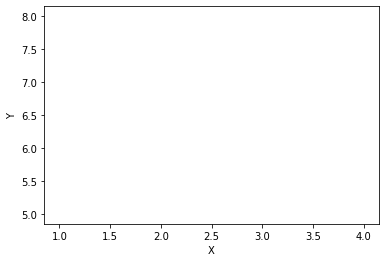

In [104]:
style.use('fivethirtyeight')
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
x = [1,2,3,4]
y = [5,6,7,8]
line =  ax.plot(x, y, 'r-')[0]

for i in range(5):
    line.set_xdata(x.append(len(x)+1))
    line.set_ydata(y.append(9))
    fig.canvas.draw()
    fig.canvas.flush_events()
    time.sleep(1)


In [84]:
for i in range(5):
    line.set_xdata(x.append(len(x)+1))
    line.set_ydata(y.append(9))
    line =  ax.plot(x, y, 'r-')[0]
    time.sleep(1)

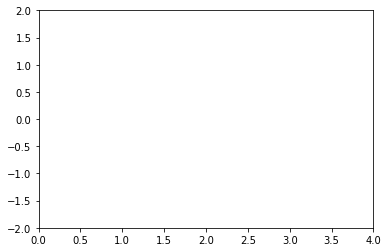

In [130]:
xx = [1,2,3,4]
yy = [5,6,7,8]
fig = plt.figure()
ax = plt.axes(xlim=(0, 4), ylim=(-2, 2))
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    x = xx[i]
    y = yy[i]
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)

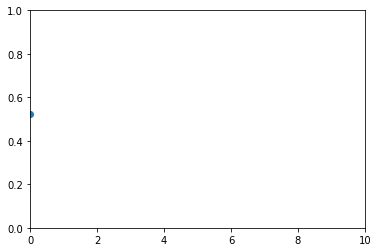

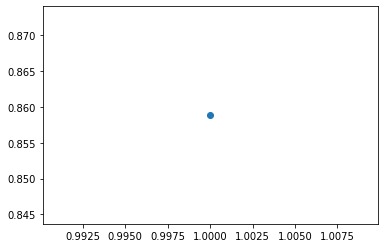

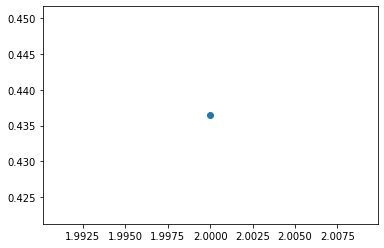

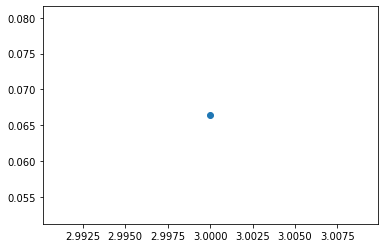

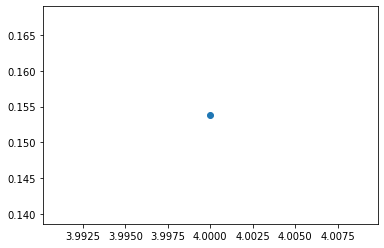

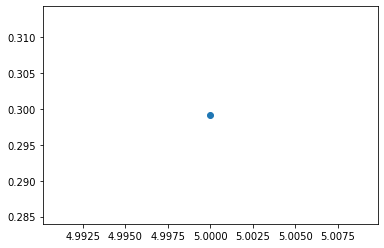

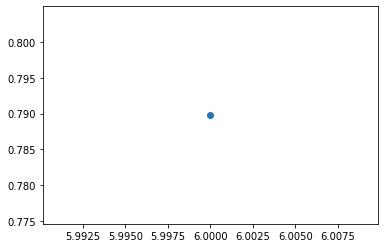

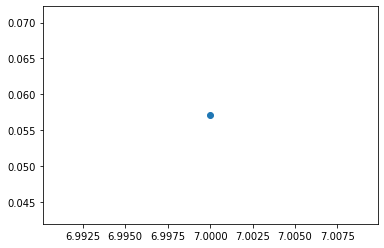

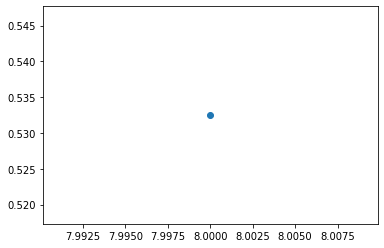

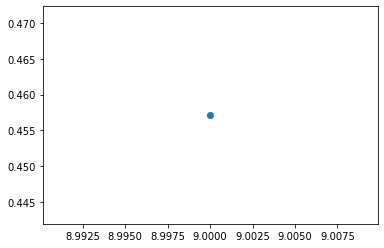